# Project Description - FIFA 2018 Data Analysis
**Overview:**
In this project, we will be looking at the player data provided by FIFA which contains information such as personal details, wages, physical attributes, technical skills, potential and their positional strengths. This is primarily data of FIFA 2018.Through this project, you will get a glimpse of insights behind the beautiful game and the kind of information and decisions a football manager goes through.


**Questions:**
Explore the data and attempt all the below asked questions in a step by step manner:
- Prepare a rank ordered list of top 10 countries with most players. List 5 countries that are producing the most numbers of footballers that play at this level? :  **5 Marks**
- Interpret the age after which a player stops improving. **5 Marks**
- Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? Visualize through a scatter plot for all the three **10 Marks**
- Top 5 players for every preferred position in terms of overall as well as potential points. Who were the best in 2018? **10 Marks** <br />
Note:
There are different preferred positions for a player and you are required to consider the first preference as the player’s preferred position. For example, if a player’s preferred positions are ‘LW RW ST’ consider his position to be LW and create a new column to store these positions. Consider this new column for position related questions. Once this new column is created, you will find around 15 unique positions.
You can refer to this code to create the column –
fifa_df['Position'] = fifa_df['Preferred Positions'].apply(lambda x: x[:3])
- Which club(s) have the maximum share of players from England? Which club(s) have the maximum share of players from Spain? Which club(s) have the maximum share of players from Germany? **10 Marks**
- As a National coach of France team you want to compare the national team of England, Spain, Italy and Germany to understand the competition. The formation of the teams is restricted to 4-3-3 (4 defenders, 3 midfielders, 3 forwards, 1 Goal Keeper) and players with overall value of more than 75 are preferred, now form the best team for each of the mentioned countries and compare them. Note down all the insights that you as a business analyst should share with the coach. **20 Marks**


In [1]:
import warnings
warnings.filterwarnings('ignore')

**Import libraries for EDA Project**

In [2]:
import pandas as pd
pd.set_option('max_columns', None)
import seaborn as sns
import re
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

**Load Dataset**

In [3]:
# Read data file in excel
df = pd.read_excel("FIFA.xlsx")
print (df)

       Unnamed: 0               Name  Age  \
0               0  Cristiano Ronaldo   32   
1               1           L. Messi   30   
2               2             Neymar   25   
3               3         L. SuÃ¡rez   30   
4               4           M. Neuer   31   
...           ...                ...  ...   
17976       17976          A. Kelsey   17   
17977       17977      B. Richardson   47   
17978       17978           J. Young   17   
17979       17979       J. Lundstram   18   
17980       17980          L. Sackey   18   

                                                 Photo Nationality  \
0       https://cdn.sofifa.org/48/18/players/20801.png    Portugal   
1      https://cdn.sofifa.org/48/18/players/158023.png   Argentina   
2      https://cdn.sofifa.org/48/18/players/190871.png      Brazil   
3      https://cdn.sofifa.org/48/18/players/176580.png     Uruguay   
4      https://cdn.sofifa.org/48/18/players/167495.png     Germany   
...                                    

In [4]:
df.head()

,Unnamed: 0,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Acceleration,Aggression,Agility,Balance,Ball control,Composure,Crossing,Curve,Dribbling,Finishing,Free kick accuracy,GK diving,GK handling,GK kicking,GK positioning,GK reflexes,Heading accuracy,Interceptions,Jumping,Long passing,Long shots,Marking,Penalties,Positioning,Reactions,Short passing,Shot power,Sliding tackle,Sprint speed,Stamina,Standing tackle,Strength,Vision,Volleys,CAM,CB,CDM,CF,CM,LAM,LB,LCB,LCM,LDM,LF,LM,LS,LW,LWB,Preferred Positions,RAM,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
0,0,Cristiano Ronaldo,32,https://cdn.sofifa.org/48/18/players/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Real Madrid CF,https://cdn.sofifa.org/24/18/teams/243.png,95.5M,565K,2228,89,63,89,63,93,95,85,81,91,94,76,7,11,15,14,11,88,29,95,77,92,22,85,95,96,83,94,23,91,92,31,80,85,88,89.0,53.0,62.0,91.0,82.0,89.0,61.0,53.0,82.0,62.0,91.0,89.0,92.0,91.0,66.0,ST LW,89.0,61.0,53.0,82.0,62.0,91.0,89.0,92.0,91.0,66.0,92.0
1,1,L. Messi,30,https://cdn.sofifa.org/48/18/players/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,93,93,FC Barcelona,https://cdn.sofifa.org/24/18/teams/241.png,105M,565K,2154,92,48,90,95,95,96,77,89,97,95,90,6,11,15,14,8,71,22,68,87,88,13,74,93,95,88,85,26,87,73,28,59,90,85,92.0,45.0,59.0,92.0,84.0,92.0,57.0,45.0,84.0,59.0,92.0,90.0,88.0,91.0,62.0,RW,92.0,57.0,45.0,84.0,59.0,92.0,90.0,88.0,91.0,62.0,88.0
2,2,Neymar,25,https://cdn.sofifa.org/48/18/players/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,94,Paris Saint-Germain,https://cdn.sofifa.org/24/18/teams/73.png,123M,280K,2100,94,56,96,82,95,92,75,81,96,89,84,9,9,15,15,11,62,36,61,75,77,21,81,90,88,81,80,33,90,78,24,53,80,83,88.0,46.0,59.0,88.0,79.0,88.0,59.0,46.0,79.0,59.0,88.0,87.0,84.0,89.0,64.0,LW,88.0,59.0,46.0,79.0,59.0,88.0,87.0,84.0,89.0,64.0,84.0
3,3,L. SuÃ¡rez,30,https://cdn.sofifa.org/48/18/players/176580.png,Uruguay,https://cdn.sofifa.org/flags/60.png,92,92,FC Barcelona,https://cdn.sofifa.org/24/18/teams/241.png,97M,510K,2291,88,78,86,60,91,83,77,86,86,94,84,27,25,31,33,37,77,41,69,64,86,30,85,92,93,83,87,38,77,89,45,80,84,88,87.0,58.0,65.0,88.0,80.0,87.0,64.0,58.0,80.0,65.0,88.0,85.0,88.0,87.0,68.0,ST,87.0,64.0,58.0,80.0,65.0,88.0,85.0,88.0,87.0,68.0,88.0
4,4,M. Neuer,31,https://cdn.sofifa.org/48/18/players/167495.png,Germany,https://cdn.sofifa.org/flags/21.png,92,92,FC Bayern Munich,https://cdn.sofifa.org/24/18/teams/21.png,61M,230K,1493,58,29,52,35,48,70,15,14,30,13,11,91,90,95,91,89,25,30,78,59,16,10,47,12,85,55,25,11,61,44,10,83,70,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Display important fields for EDA
df_new = df[['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value','Wage', 'Preferred Positions']]
df_new.head(10)

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
0,Cristiano Ronaldo,32,Portugal,94,94,Real Madrid CF,95.5M,565K,ST LW
1,L. Messi,30,Argentina,93,93,FC Barcelona,105M,565K,RW
2,Neymar,25,Brazil,92,94,Paris Saint-Germain,123M,280K,LW
3,L. SuÃ¡rez,30,Uruguay,92,92,FC Barcelona,97M,510K,ST
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,230K,GK
5,R. Lewandowski,28,Poland,91,91,FC Bayern Munich,92M,355K,ST
6,De Gea,26,Spain,90,92,Manchester United,64.5M,215K,GK
7,E. Hazard,26,Belgium,90,91,Chelsea,90.5M,295K,LW
8,T. Kroos,27,Germany,90,90,Real Madrid CF,79M,340K,CDM CM
9,G. HiguaÃ­n,29,Argentina,90,90,Juventus,77M,275K,ST


In [6]:
# Prepare a rank ordered list of top 10 countries with most players. 
List_of_Top10 = df.groupby('Nationality').size().sort_values(ascending=False).head(10)

In [7]:
print(List_of_Top10)

Nationality
England        1630
Germany        1140
Spain          1019
France          978
Argentina       965
Brazil          812
Italy           799
Colombia        592
Japan           469
Netherlands     429
dtype: int64


In [8]:
# List 5 countries that are producing the most numbers of footballers that play at this level
List_of_Top5 = df.groupby('Nationality').size().sort_values(ascending=False).head()

In [9]:
print(List_of_Top5)

Nationality
England      1630
Germany      1140
Spain        1019
France        978
Argentina     965
dtype: int64


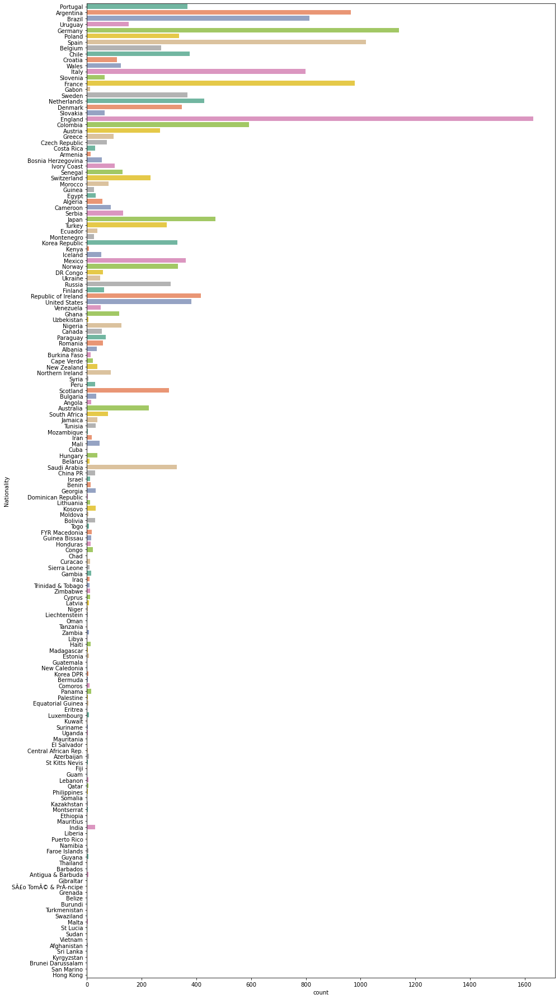

In [10]:
plt.figure(figsize=(15,32))
sns.countplot(y = df.Nationality,palette="Set2")

**Summary:** Most players are from England,Germany,Spain,France,Argentina

In [11]:
# Check for null in Age column
df['Age'].isnull().sum()

0

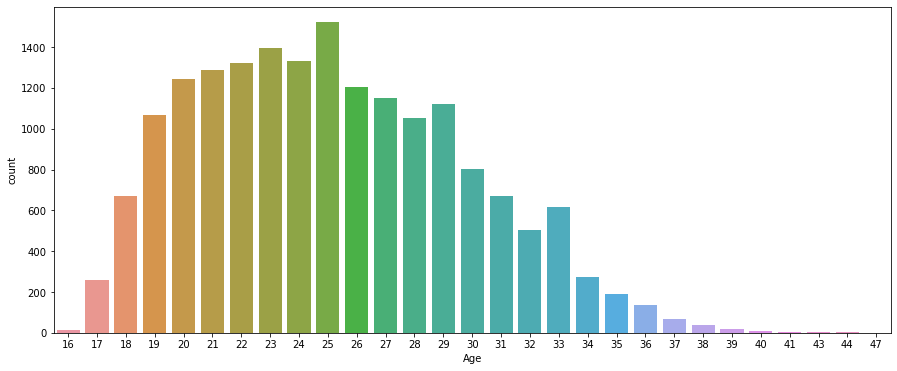

In [12]:
# Visualize age of players in the dataset
plt.figure(figsize=(15,6))
sns.countplot(x="Age",data=df) 

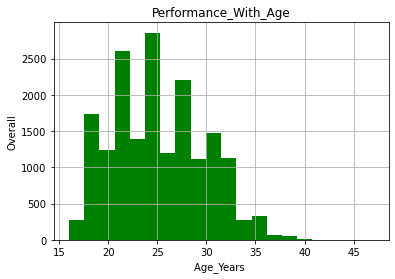

In [13]:
age_perf = df['Age']
plt.hist(age_perf, 20, facecolor='green')
plt.xlabel("Age_Years ")
plt.ylabel("Overall")
plt.title("Performance_With_Age")
plt.grid(True)
plt.show()

**Summary:** According to the dataset available ,performance of players stops improving after age of 33

In [14]:
# Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?
# Visualize through a scatter plot for all the three

# Use important fields only for EDA
df_new.head(10)

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
0,Cristiano Ronaldo,32,Portugal,94,94,Real Madrid CF,95.5M,565K,ST LW
1,L. Messi,30,Argentina,93,93,FC Barcelona,105M,565K,RW
2,Neymar,25,Brazil,92,94,Paris Saint-Germain,123M,280K,LW
3,L. SuÃ¡rez,30,Uruguay,92,92,FC Barcelona,97M,510K,ST
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,230K,GK
5,R. Lewandowski,28,Poland,91,91,FC Bayern Munich,92M,355K,ST
6,De Gea,26,Spain,90,92,Manchester United,64.5M,215K,GK
7,E. Hazard,26,Belgium,90,91,Chelsea,90.5M,295K,LW
8,T. Kroos,27,Germany,90,90,Real Madrid CF,79M,340K,CDM CM
9,G. HiguaÃ­n,29,Argentina,90,90,Juventus,77M,275K,ST


In [15]:
# Check for unique Value
df_new.Value.unique()

array(['95.5M', '105M', '123M', '97M', '61M', '92M', '64.5M', '90.5M',
       '79M', '77M', '52M', '83M', '59M', '67.5M', '57M', '69.5M',
       '66.5M', '38M', '4.5M', '75M', '70.5M', '44M', '48M', '40M', '60M',
       '34M', '27M', '36M', '52.5M', '65M', '37.5M', '48.5M', '29M',
       '29.5M', '56M', '56.5M', '44.5M', '47.5M', '45M', '40.5M', '33M',
       '46M', '42.5M', '43M', '34.5M', '25.5M', '41M', '22.5M', '13.5M',
       '10.5M', '51.5M', '46.5M', '42M', '24.5M', '39M', '22M', '35.5M',
       '30M', '30.5M', '43.5M', '28.5M', '25M', '26M', '5M', '32M',
       '39.5M', '32.5M', '31M', '31.5M', '35M', '18.5M', '28M', '23M',
       '21M', '9M', '11M', '41.5M', '38.5M', '37M', '27.5M', '26.5M',
       '20M', '24M', 0, '23.5M', '17.5M', '16.5M', '14.5M', '19M', '17M',
       '6M', '19.5M', '15.5M', '12.5M', '3.5M', '18M', '21.5M', '15M',
       '20.5M', '14M', '6.5M', '10M', '8.5M', '12M', '16M', '11.5M',
       '13M', '7M', '3.8M', '4.2M', '5.5M', '9.5M', '8M', '7.5M', '1.7M',
  

In [16]:
# Make a copy of data
footballers = df_new.copy()
footballers['Unit'] = df_new['Value'].str[-1]
footballers['Value_In_M'] = np.where(footballers['Unit'] == '0', 0, 
                                    footballers['Value'].str[1:-1].replace(r'[a-zA-Z]',''))
#Check of unique values for newly added Unit column
footballers.Unit.unique()

array(['M', nan, 'K'], dtype=object)

In [17]:
#Check for values for newly added Unit column and delete them
footballers[footballers['Unit'].isnull()]
footballers.dropna(inplace=True)

In [18]:
#Check of unique values after Null removal for Unit
footballers.Unit.unique()

array(['M', 'K'], dtype=object)

In [19]:
# Check for unique values for newly added Value_In_M column
footballers.Value_In_M.unique()

array(['5.5', '05', '23', '7', '1', '2', '4.5', '0.5', '9', '3', '7.5',
       '9.5', '6.5', '8', '.5', '5', '4', '0', '6', '2.5', '8.5', '3.5',
       '1.5', '', '.8', '.2', '.7', '50', '.4', '00', '.9', '.1', '.3',
       '.6', '25', '75', '70', '10', '60', '40', '20', '30', '80', '90'],
      dtype=object)

In [20]:
#select only non-blank
footballers = footballers[footballers['Value_In_M'] != '']
footballers.Value_In_M.unique()

array(['5.5', '05', '23', '7', '1', '2', '4.5', '0.5', '9', '3', '7.5',
       '9.5', '6.5', '8', '.5', '5', '4', '0', '6', '2.5', '8.5', '3.5',
       '1.5', '.8', '.2', '.7', '50', '.4', '00', '.9', '.1', '.3', '.6',
       '25', '75', '70', '10', '60', '40', '20', '30', '80', '90'],
      dtype=object)

In [21]:
footballers.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions,Unit,Value_In_M
0,Cristiano Ronaldo,32,Portugal,94,94,Real Madrid CF,95.5M,565K,ST LW,M,5.5
1,L. Messi,30,Argentina,93,93,FC Barcelona,105M,565K,RW,M,05
2,Neymar,25,Brazil,92,94,Paris Saint-Germain,123M,280K,LW,M,23
3,L. SuÃ¡rez,30,Uruguay,92,92,FC Barcelona,97M,510K,ST,M,7
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,230K,GK,M,1


In [22]:
footballers['Value_In_M'] = footballers['Value_In_M'].astype(float)

In [23]:
footballers['Value_In_M'] = np.where(footballers['Unit'] == 'M', 
                                    footballers['Value_In_M'], 
                                    footballers['Value_In_M']/1000)
footballers = footballers.assign(Value=footballers['Value_In_M'],
                                 Position=footballers['Preferred Positions'].str.split().str[0])

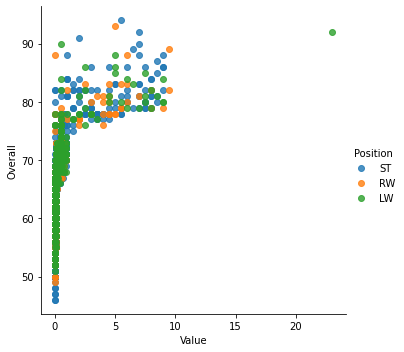

In [27]:
sns.lmplot(x='Value', y='Overall', hue='Position', 
           data=footballers.loc[footballers['Position'].isin(['ST', 'RW', 'LW'])], 
           fit_reg=False,scatter=True)

**Summary :** The players in strikers position (ST) gets paid the most

In [63]:
#Top 5 players for every preferred position in terms of overall as well as potential points. Who were the best in 2018?
top_pref_df = df[['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value', 'Preferred Positions']]
top_pref_df.head(10)

,Name,Age,Nationality,Overall,Potential,Club,Value,Preferred Positions
0,Cristiano Ronaldo,32,Portugal,94,94,Real Madrid CF,95.5M,ST LW
1,L. Messi,30,Argentina,93,93,FC Barcelona,105M,RW
2,Neymar,25,Brazil,92,94,Paris Saint-Germain,123M,LW
3,L. SuÃ¡rez,30,Uruguay,92,92,FC Barcelona,97M,ST
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,GK
5,R. Lewandowski,28,Poland,91,91,FC Bayern Munich,92M,ST
6,De Gea,26,Spain,90,92,Manchester United,64.5M,GK
7,E. Hazard,26,Belgium,90,91,Chelsea,90.5M,LW
8,T. Kroos,27,Germany,90,90,Real Madrid CF,79M,CDM CM
9,G. HiguaÃ­n,29,Argentina,90,90,Juventus,77M,ST


In [64]:
pref_columns = [
    'Name', 
    'Age',  
    'Nationality', 
    'Overall', 
    'Potential', 
    'Club', 
    'Value', 
    'Wage', 
    'Preferred Positions'
]
top_players = pd.DataFrame(top_pref_df, columns=pref_columns)

In [65]:
top_players.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
0,Cristiano Ronaldo,32,Portugal,94,94,Real Madrid CF,95.5M,NaN,ST LW
1,L. Messi,30,Argentina,93,93,FC Barcelona,105M,NaN,RW
2,Neymar,25,Brazil,92,94,Paris Saint-Germain,123M,NaN,LW
3,L. SuÃ¡rez,30,Uruguay,92,92,FC Barcelona,97M,NaN,ST
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,NaN,GK


In [111]:
top_players['Position'] = top_players['Preferred Positions'].apply(lambda x: x[:3])

In [112]:
top_players.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions,Position
0,Cristiano Ronaldo,32,Portugal,94,94,Real Madrid CF,95.5M,NaN,ST LW,ST
1,L. Messi,30,Argentina,93,93,FC Barcelona,105M,NaN,RW,RW
2,Neymar,25,Brazil,92,94,Paris Saint-Germain,123M,NaN,LW,LW
3,L. SuÃ¡rez,30,Uruguay,92,92,FC Barcelona,97M,NaN,ST,ST
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,NaN,GK,GK


**Summary:** Top 5 players for each position are as follows :- <br />
Cristiano Ronaldo - ST <br />
L. Messi - RW <br />
Neymar - LW <br />
L. SuÃ¡rez - ST <br />
M. Neuer - GK <br />

In [28]:
#Which club(s) have the maximum share of players from England?
#Which club(s) have the maximum share of players from Spain? 
#Which club(s) have the maximum share of players from Germany?
custom_columns = [
    'Name',  
    'Nationality', 
    'Club', 
]
club_players = pd.DataFrame(df_new, columns=custom_columns)

In [29]:
club_players.head()

,Name,Nationality,Club
0,Cristiano Ronaldo,Portugal,Real Madrid CF
1,L. Messi,Argentina,FC Barcelona
2,Neymar,Brazil,Paris Saint-Germain
3,L. SuÃ¡rez,Uruguay,FC Barcelona
4,M. Neuer,Germany,FC Bayern Munich


In [46]:
club_players['Nationality'].value_counts()

England       1630
Germany       1140
Spain         1019
France         978
Argentina      965
              ... 
Eritrea          1
Somalia          1
Kyrgyzstan       1
Fiji             1
Barbados         1
Name: Nationality, Length: 165, dtype: int64

In [57]:
club_dat = club_players.groupby('Club')['Club'].agg(['count']).sort_values(['count'], ascending=False)
club_dat.head()

,count
Club,
Villarreal CF,35
OGC Nice,34
Manchester United,34
VfL Wolfsburg,34
UD Las Palmas,34


In [32]:
#England_Players_In_Club = club_players['Nationality']='England'
#print(England_Players_In_Club)

England_footballers = club_players[club_players['Nationality'] == 'England']
England_footballers.Nationality.unique()

array(['England'], dtype=object)

In [33]:
England_footballers.head()

,Name,Nationality,Club
46,H. Kane,England,Tottenham Hotspur
96,D. Alli,England,Tottenham Hotspur
123,G. Cahill,England,Chelsea
161,K. Walker,England,Manchester City
171,A. Lallana,England,Liverpool


In [34]:
England_footballers.count()

Name           1630
Nationality    1630
Club           1630
dtype: int64

In [37]:
Eng_dat = England_footballers.groupby('Club')['Club'].agg(['count']).sort_values(['count'], ascending=False)
Eng_dat.head()

,count
Club,
Bolton Wanderers,24
Shrewsbury,24
Chesterfield,22
Colchester United,22
Burton Albion,22


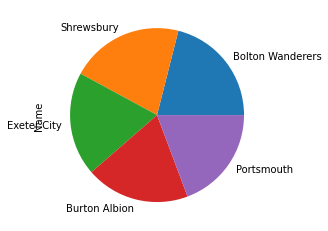

In [97]:
England_footballers.groupby("Club").Name.count().sort_values(ascending=False).head(5).plot(kind="pie");

**Summary :** The following Clubs have max share of players from England - Bolton Wanderers,Shrewsbury,Chesterfield,Colchester United,Burton Albion

In [48]:
Spain_footballers = club_players[club_players['Nationality'] == 'Spain']
Spain_footballers.Nationality.unique()

array(['Spain'], dtype=object)

In [49]:
Spain_footballers.head()

,Name,Nationality,Club
6,De Gea,Spain,Manchester United
10,Sergio Ramos,Spain,Real Madrid CF
22,Thiago,Spain,FC Bayern Munich
42,David Silva,Spain,Manchester City
44,PiquÃ©,Spain,FC Barcelona


In [54]:
Spain_footballers.count()

Name           1019
Nationality    1019
Club           1019
dtype: int64

In [50]:
Spain_dat = Spain_footballers.groupby('Club')['Club'].agg(['count']).sort_values(['count'], ascending=False)
Spain_dat.head()

,count
Club,
CA Osasuna,27
Athletic Club de Bilbao,26
UD Las Palmas,25
Lorca Deportiva CF,25
Real Valladolid,25


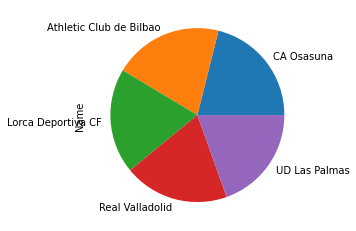

In [98]:
Spain_footballers.groupby("Club").Name.count().sort_values(ascending=False).head(5).plot(kind="pie");

**Summary :** The following Clubs have max share of players from Spain - CA Osasuna, Athletic Club de Bilbao,UD Las Palmas,Lorca Deportiva CF,Real Valladolid

In [51]:
German_footballers = club_players[club_players['Nationality'] == 'Germany']
German_footballers.Nationality.unique()

array(['Germany'], dtype=object)

In [52]:
German_footballers.head()

,Name,Nationality,Club
4,M. Neuer,Germany,FC Bayern Munich
8,T. Kroos,Germany,Real Madrid CF
25,J. Boateng,Germany,FC Bayern Munich
27,M. Hummels,Germany,FC Bayern Munich
28,M. Ã–zil,Germany,Arsenal


In [55]:
German_footballers.count()

Name           1140
Nationality    1140
Club           1140
dtype: int64

In [100]:
German_dat = German_footballers.groupby('Club')['Club'].agg(['count']).sort_values(['count'], ascending=False)
German_dat.head()

,count
Club,
Holstein Kiel,26
SSV Jahn Regensburg,23
SV Meppen,23
FSV Zwickau,23
1. FC Magdeburg,23


**Summary :** The following Clubs have max share of players from Germany - Holstein Kiel,SSV Jahn Regensburg,SV Meppen,FSV Zwickau,1. FC Magdeburg

In [66]:
#As a National coach of France team you want to compare the national team of England, Spain, Italy and Germany
#to understand the competition. The formation of the teams is 
#restricted to 4-3-3 (4 defenders, 3 midfielders, 3 forwards, 1 Goal Keeper) 
#and players with overall value of more than 75 are preferred, 
#now form the best team for each of the mentioned countries and compare them. 
#Note down all the insights that you as a business analyst should share with the coach.

In [68]:
df['Remaining Potential'] = df['Potential'] - df['Overall']

In [69]:
df['Preferred Position'] = df['Preferred Positions'].str.split().str[0]

In [70]:
def best_squad(position):
    df_copy = df.copy()
    store = []
    for i in position:
        store.append([i,df_copy.loc[[df_copy[df_copy['Preferred Position'] == i]['Overall'].idxmax()]]['Name'].to_string(index = False), df_copy[df_copy['Preferred Position'] == i]['Overall'].max()])
        df_copy.drop(df_copy[df_copy['Preferred Position'] == i]['Overall'].idxmax(), inplace = True)
    return pd.DataFrame(np.array(store).reshape(11,3), columns = ['Position', 'Player', 'Overall']).to_string(index = False)

# 4-3-3
squad_433 = ['GK', 'LB', 'CB', 'CB', 'RB', 'LM', 'CDM', 'RM', 'LW', 'ST', 'RW']
print ('4-3-3')
print (best_squad(squad_433))

4-3-3
Position              Player Overall
      GK            M. Neuer      92
      LB             Marcelo      87
      CB        Sergio Ramos      90
      CB        G. Chiellini      89
      RB            Carvajal      84
      LM          C. Eriksen      87
     CDM            T. Kroos      90
      RM        K. De Bruyne      89
      LW              Neymar      92
      ST   Cristiano Ronaldo      94
      RW            L. Messi      93


**BEST SQUAD based on the overall value of all players**

In [73]:
#Team England , filter for Nationality equals England (1630 players)
ENG_top_players = top_players[top_players['Nationality'] == 'England']
ENG_top_players

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
46,H. Kane,23,England,86,90,Tottenham Hotspur,59M,NaN,ST
96,D. Alli,21,England,84,90,Tottenham Hotspur,43M,NaN,LM CF CAM
123,G. Cahill,31,England,84,84,Chelsea,21M,NaN,CB
161,K. Walker,27,England,83,84,Manchester City,24M,NaN,RWB RB
171,A. Lallana,29,England,83,83,Liverpool,25M,NaN,CM
...,...,...,...,...,...,...,...,...,...
17973,T. Sawyer,18,England,46,58,Grimsby Town,50K,NaN,CM
17974,J. Keeble,18,England,46,56,Grimsby Town,40K,NaN,CB
17976,A. Kelsey,17,England,46,63,Scunthorpe United,50K,NaN,GK
17977,B. Richardson,47,England,46,46,Wycombe Wanderers,0,NaN,GK


In [76]:
ENG_top_players['Remaining Potential'] = ENG_top_players['Potential'] - ENG_top_players['Overall']

In [77]:
ENG_top_players['Preferred Position'] = ENG_top_players['Preferred Positions'].str.split().str[0]

In [78]:
def best_eng_squad(position):
    df_eng_copy = ENG_top_players.copy()
    store_eng = []
    for i in position:
        store_eng.append([i,df_eng_copy.loc[[df_eng_copy[df_eng_copy['Preferred Position'] == i]['Overall'].idxmax()]]['Name'].to_string(index = False), df_eng_copy[df_eng_copy['Preferred Position'] == i]['Overall'].max()])
        df_eng_copy.drop(df_eng_copy[df_eng_copy['Preferred Position'] == i]['Overall'].idxmax(), inplace = True)
    return pd.DataFrame(np.array(store_eng).reshape(11,3), columns = ['Position', 'Player', 'Overall']).to_string(index = False)

# 4-3-3
squad_433 = ['GK', 'LB', 'CB', 'CB', 'RB', 'LM', 'CDM', 'RM', 'LW', 'ST', 'RW']
print ('4-3-3')
print (best_eng_squad(squad_433))

4-3-3
Position        Player Overall
      GK       J. Hart      82
      LB     L. Baines      82
      CB     G. Cahill      84
      CB      M. Keane      81
      RB      N. Clyne      82
      LM       D. Alli      84
     CDM   J. Wilshere      81
      RM   M. Rashford      80
      LW      A. Reach      71
      ST       H. Kane      86
      RW    R. Barkley      81


**BEST England Squad**

In [79]:
#Team Spain , filter for Nationality equals Spain (1019 players)
SPAIN_top_players = top_players[top_players['Nationality'] == 'Spain']
SPAIN_top_players

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
6,De Gea,26,Spain,90,92,Manchester United,64.5M,NaN,GK
10,Sergio Ramos,31,Spain,90,90,Real Madrid CF,52M,NaN,CB
22,Thiago,26,Spain,88,90,FC Bayern Munich,70.5M,NaN,CDM CAM CM
42,David Silva,31,Spain,87,87,Manchester City,44M,NaN,LM CM CAM
44,PiquÃ©,30,Spain,87,87,FC Barcelona,37.5M,NaN,CB
...,...,...,...,...,...,...,...,...,...
16890,Robert Sanchez,19,Spain,55,73,Brighton & Hove Albion,160K,NaN,GK
17155,Dani Renda,23,Spain,54,58,CD Lugo,90K,NaN,CM
17346,Erik Sarmiento,18,Spain,53,72,Manchester City,110K,NaN,CM LB
17637,Hugo,23,Spain,52,61,Albacete BalompiÃ©,60K,NaN,GK


In [81]:
SPAIN_top_players['Remaining Potential'] = SPAIN_top_players['Potential'] - SPAIN_top_players['Overall']

In [82]:
SPAIN_top_players['Preferred Position'] = SPAIN_top_players['Preferred Positions'].str.split().str[0]

In [83]:
def best_spain_squad(position):
    df_spain_copy = SPAIN_top_players.copy()
    store_spain = []
    for i in position:
        store_spain.append([i,df_spain_copy.loc[[df_spain_copy[df_spain_copy['Preferred Position'] == i]['Overall'].idxmax()]]['Name'].to_string(index = False), df_spain_copy[df_spain_copy['Preferred Position'] == i]['Overall'].max()])
        df_spain_copy.drop(df_spain_copy[df_spain_copy['Preferred Position'] == i]['Overall'].idxmax(), inplace = True)
    return pd.DataFrame(np.array(store_spain).reshape(11,3), columns = ['Position', 'Player', 'Overall']).to_string(index = False)

# 4-3-3
squad_433 = ['GK', 'LB', 'CB', 'CB', 'RB', 'LM', 'CDM', 'RM', 'LW', 'ST', 'RW']
print ('4-3-3')
print (best_spain_squad(squad_433))

4-3-3
Position          Player Overall
      GK          De Gea      90
      LB      Jordi Alba      85
      CB    Sergio Ramos      90
      CB          PiquÃ©      87
      RB        Carvajal      84
      LM     David Silva      87
     CDM          Thiago      88
      RM       Juan Mata      84
      LW   Marco Asensio      84
      ST     Diego Costa      86
      RW      Iago Aspas      83


**BEST SPAIN Squad**

In [84]:
#Team Italy , filter for Nationality equals Italy (799 players)
ITALY_top_players = top_players[top_players['Nationality'] == 'Italy']
ITALY_top_players

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
17,G. Chiellini,32,Italy,89,89,Juventus,38M,NaN,CB
18,G. Buffon,39,Italy,89,89,Juventus,4.5M,NaN,GK
24,L. Bonucci,30,Italy,88,88,Milan,44M,NaN,CB
34,M. Verratti,24,Italy,87,91,Paris Saint-Germain,64.5M,NaN,CDM CM
72,L. Insigne,26,Italy,85,86,Napoli,45M,NaN,LW
...,...,...,...,...,...,...,...,...,...
17769,M. Proietti,20,Italy,51,57,Perugia,40K,NaN,LB
17809,G. Fasolo,18,Italy,50,65,Cittadella,60K,NaN,ST
17909,A. Giacomel,18,Italy,49,64,Empoli,50K,NaN,GK
17940,A. Corasaniti,18,Italy,48,63,Cittadella,50K,NaN,GK


In [85]:
ITALY_top_players['Remaining Potential'] = ITALY_top_players['Potential'] - ITALY_top_players['Overall']

In [86]:
ITALY_top_players['Preferred Position'] = ITALY_top_players['Preferred Positions'].str.split().str[0]

In [87]:
def best_italy_squad(position):
    df_italy_copy = ITALY_top_players.copy()
    store_italy = []
    for i in position:
        store_italy.append([i,df_italy_copy.loc[[df_italy_copy[df_italy_copy['Preferred Position'] == i]['Overall'].idxmax()]]['Name'].to_string(index = False), df_italy_copy[df_italy_copy['Preferred Position'] == i]['Overall'].max()])
        df_italy_copy.drop(df_italy_copy[df_italy_copy['Preferred Position'] == i]['Overall'].idxmax(), inplace = True)
    return pd.DataFrame(np.array(store_italy).reshape(11,3), columns = ['Position', 'Player', 'Overall']).to_string(index = False)

# 4-3-3
squad_433 = ['GK', 'LB', 'CB', 'CB', 'RB', 'LM', 'CDM', 'RM', 'LW', 'ST', 'RW']
print ('4-3-3')
print (best_italy_squad(squad_433))

4-3-3
Position            Player Overall
      GK         G. Buffon      89
      LB           Emerson      76
      CB      G. Chiellini      89
      CB        L. Bonucci      88
      RB        M. Darmian      80
      LM   F. Bernardeschi      82
     CDM       M. Verratti      87
      RM     D. Zappacosta      79
      LW        L. Insigne      85
      ST        A. Belotti      83
      RW        D. Berardi      81


**BEST ITALY SQUAD**

In [88]:
#Team Germany , filter for Nationality equals Germany (1140 players)
Germany_top_players = top_players[top_players['Nationality'] == 'Germany']
Germany_top_players

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
4,M. Neuer,31,Germany,92,92,FC Bayern Munich,61M,NaN,GK
8,T. Kroos,27,Germany,90,90,Real Madrid CF,79M,NaN,CDM CM
25,J. Boateng,28,Germany,88,88,FC Bayern Munich,48M,NaN,CB
27,M. Hummels,28,Germany,88,88,FC Bayern Munich,48M,NaN,CB
28,M. Ã–zil,28,Germany,88,88,Arsenal,60M,NaN,RW CAM
...,...,...,...,...,...,...,...,...,...
17892,L. Tigges,18,Germany,49,64,VfL OsnabrÃ¼ck,50K,NaN,GK
17900,T. Krahnert,20,Germany,49,63,FC Carl Zeiss Jena,60K,NaN,CAM
17921,J. Schau,18,Germany,49,67,FC Carl Zeiss Jena,50K,NaN,RM CDM
17930,C. Gnerlich,18,Germany,49,62,SV Meppen,50K,NaN,CDM


In [89]:
Germany_top_players['Remaining Potential'] = Germany_top_players['Potential'] - Germany_top_players['Overall']

In [90]:
Germany_top_players['Preferred Position'] = Germany_top_players['Preferred Positions'].str.split().str[0]

In [92]:
def best_Germany_squad(position):
    df_Germany_copy = Germany_top_players.copy()
    store_Germany = []
    for i in position:
        store_Germany.append([i,df_Germany_copy.loc[[df_Germany_copy[df_Germany_copy['Preferred Position'] == i]['Overall'].idxmax()]]['Name'].to_string(index = False), df_Germany_copy[df_Germany_copy['Preferred Position'] == i]['Overall'].max()])
        df_Germany_copy.drop(df_Germany_copy[df_Germany_copy['Preferred Position'] == i]['Overall'].idxmax(), inplace = True)
    return pd.DataFrame(np.array(store_Germany).reshape(11,3), columns = ['Position', 'Player', 'Overall']).to_string(index = False)

# 4-3-3
squad_433 = ['GK', 'LB', 'CB', 'CB', 'RB', 'LM', 'CDM', 'RM', 'LW', 'ST', 'RW']
print ('4-3-3')
print (best_Germany_squad(squad_433))

4-3-3
Position         Player Overall
      GK       M. Neuer      92
      LB      J. Hector      80
      CB     J. Boateng      88
      CB     M. Hummels      88
      RB    A. RÃ¼diger      82
      LM     J. Draxler      84
     CDM       T. Kroos      90
      RM   K. Bellarabi      82
      LW        M. Reus      86
      ST     T. MÃ¼ller      86
      RW       M. Ã–zil      88


**BEST GERMANY SQUAD**

In [93]:
#Team France , filter for Nationality equals France (978 players)
France_top_players = top_players[top_players['Nationality'] == 'France']
France_top_players

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Positions
21,A. Griezmann,26,France,88,91,AtlÃ©tico Madrid,75M,NaN,LW RW ST
29,H. Lloris,30,France,88,88,Tottenham Hotspur,38M,NaN,GK
33,N. KantÃ©,26,France,87,90,Chelsea,52.5M,NaN,CM CDM
35,P. Pogba,24,France,87,92,Manchester United,66.5M,NaN,CDM CM
64,K. Benzema,29,France,86,86,Real Madrid CF,44.5M,NaN,ST
...,...,...,...,...,...,...,...,...,...
17648,J. Dorangeon,20,France,51,61,La Berrichonne de ChÃ¢teauroux,50K,NaN,GK
17661,E. Di Santantonio,21,France,51,60,Brescia,50K,NaN,CDM
17665,L. Dias,18,France,51,71,NÃ®mes Olympique,60K,NaN,GK
17753,T. De Villardi,23,France,51,58,Minnesota Thunder,50K,NaN,CM


In [94]:
France_top_players['Remaining Potential'] = France_top_players['Potential'] - France_top_players['Overall']

In [95]:
France_top_players['Preferred Position'] = France_top_players['Preferred Positions'].str.split().str[0]

In [96]:
def best_France_squad(position):
    df_France_copy = France_top_players.copy()
    store_France = []
    for i in position:
        store_France.append([i,df_France_copy.loc[[df_France_copy[df_France_copy['Preferred Position'] == i]['Overall'].idxmax()]]['Name'].to_string(index = False), df_France_copy[df_France_copy['Preferred Position'] == i]['Overall'].max()])
        df_France_copy.drop(df_France_copy[df_France_copy['Preferred Position'] == i]['Overall'].idxmax(), inplace = True)
    return pd.DataFrame(np.array(store_France).reshape(11,3), columns = ['Position', 'Player', 'Overall']).to_string(index = False)

# 4-3-3
squad_433 = ['GK', 'LB', 'CB', 'CB', 'RB', 'LM', 'CDM', 'RM', 'LW', 'ST', 'RW']
print ('4-3-3')
print (best_France_squad(squad_433))

4-3-3
Position         Player Overall
      GK      H. Lloris      88
      LB     L. Kurzawa      80
      CB      R. Varane      85
      CB     A. Laporte      84
      RB       K. Zouma      79
      LM       T. Lemar      83
     CDM       P. Pogba      87
      RM     F. Thauvin      82
      LW   A. Griezmann      88
      ST     K. Benzema      86
      RW     Y. Salibur      77


**BEST FRANCE SQUAD**

**Final Comparison of Teams - England, Spain, Italy and Germany to find competion**

In [105]:
import pandas_profiling

In [107]:
ENG_top_players.profile_report()

In [108]:
SPAIN_top_players.profile_report()

In [109]:
ITALY_top_players.profile_report()

In [110]:
Germany_top_players.profile_report()

In [106]:
France_top_players.profile_report()

# Insights for France coach
- Germany has the highest rated Goal Keeper, but rating for Goal Keeper selected on France's squad is better than England's GK
- For the LB position,France has a equivally rated player as of Germany's LB, but is weaker compared to other team's LB ratings
- For the CDM position,France has a equivally rated player as of Italy's CDM,but is weaker compared to other team's CDM ratings
- Based on the comparison of player ratings,overall France has a good squad than Italy's squad. But is weaker compared to other squads
